# **Data Preprocessing Notebook** 

For this project, we'll be working with two datasets: 

- https://www.kaggle.com/datasets/smlztrkk/car-images-dataset 
- https://www.kaggle.com/datasets/occultainsights/honda-cars-over-11k-labeled-images

We'll need to download and merge them into one cohesive dataset. Since the datasets are quite small and the subfolder naming conventions are very similar, we can manually copy & paste subfolders instead of creating a function to manipulate the file contents for us. 

The new folder, "Merged_Car_Dataset", is largely unchanged except for the Honda subfolder, which now has more models. All the images are in .jpg format.

In [9]:
# Standard data/image preprocessing packages:
from pathlib import Path
import random
from PIL import Image, UnidentifiedImageError, ImageStat, ImageOps
import matplotlib.pyplot as plt
import math
import numpy as np, cv2, imagehash
from shutil import move
from tqdm import tqdm
import shutil


In [2]:
# Function to preview the images (one random image per make & model):
def display_sample_image(
    dataset_root="Merged_Car_Dataset", 
    n_cols=4, 
    figsize_per_image=(3,3),
    image_exts=".jpg", 
    random_seed=42):

    """
    Display one randomly selected representative image for every make & model pair found in the dataset. 
    This assumes the folder layout: <dataset_root>/<Make>/<Model>/*.jpg.
    """

    # Initialize random seed:
    random.seed(random_seed)

    # Grab the dataset root:
    root = Path(dataset_root)

    if not root.exists():
        raise FileNotFoundError(f"Dataset root not found: {root}")

    # Create a list of the make & model pairs:
    pairs = []

    for make_dir in sorted([d for d in root.iterdir() if d.is_dir()]):
        for model_dir in sorted([d for d in make_dir.iterdir() if d.is_dir()]):
            images = [p for p in model_dir.iterdir() if p.is_file() and p.suffix.lower() in image_exts]
            if images:
                pairs.append((make_dir.name, model_dir.name, images))
    
    if not pairs:
        print("No make/model image folders found under", dataset_root)
        return

    # Pre-define image display settings:
    n_items = len(pairs)
    n_cols = min(n_cols, n_items)
    n_rows = math.ceil(n_items / n_cols)
    fig_width = n_cols * figsize_per_image[0]
    fig_height = n_rows * figsize_per_image[1]
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(fig_width, fig_height))
    axes_list = axes.flatten() if n_items > 1 else [axes]

    for ax in axes_list[n_items:]:
        ax.axis("off")
    
    for i, (make, model, images) in enumerate(pairs):
        ax = axes_list[i]
        chosen = None
        
        for attempt in random.sample(images, min(len(images), 5)):
            try: 
                with Image.open(attempt) as image:
                    image.verify()
                chosen = attempt
                break
            except (UnidentifiedImageError, OSError):
                continue
        
        if chosen is None:
            ax.axis("off")
            ax.set_title(f"{make}/{model}\n(no valid image)", fontsize=9)
            continue

        with Image.open(chosen) as image:
            image = image.convert("RGB")
            ax.imshow(image)
            ax.set_title(f"{make}/{model}", fontsize=9)
            ax.axis("off")

    # Display images:
    plt.tight_layout()
    plt.show()

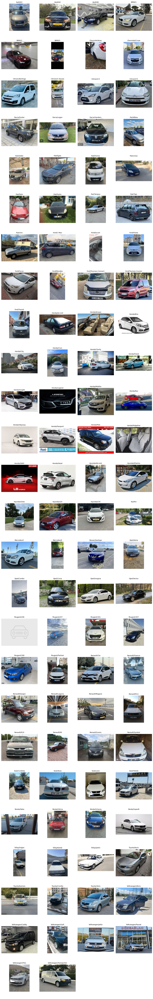

In [3]:
# Call function to display images:
display_sample_image()

As you can see, there's quite a variety in the angles, sizes, and settings of each image. A couple of issues are apparent:

- There are placeholder images in the dataset (there's just a car icon where the actual picture should be).
- Some images are framed with advertisements.
- Some images don't display the entire car from the outside; they only display an interior or a digital model of the interior.

We'll need a filter to detect and move unusable images to a separate folder. The filter will obviously not be a perfect solution (it is inevitable that some undesirable images will make their way into our final dataset), but it will greatly enhance the quality of the data that we feed into our models later on.

I will be using a pretrained model, CLIP, to identify unusable images. CLIP is a model that was developed by OpenAI that connects images and text. That is, it tries to match images to text by turning the images into embeddings, and it also converts text descriptions into embeddings. It then matches the embeddings. For example, if I say "image created using CGI", it will try to match that text with images that are generated by CGI (assuming its trained well). The other option here would be to create a filter heuristically, but it's more convenient for our purposes to use CLIP instead.

In [4]:
# Check for "unusable images" using filters (run this cell to run the CLIP script):
!python clip_filter.py \
    --root "Merged_Car_Dataset" \
    --rejects "Rejected_Images" \
    --batch-size 16

[INFO] Device: mps
[INFO] Model: ViT-L-14  |  Pretrained: openai
[INFO] Root: Merged_Car_Dataset
[INFO] Rejects: Rejected_Images
[INFO] Dry run: False
[INFO] Thresholds: {'keep_exterior_min': 0.27, 'interior_min': 0.28, 'cgi_like_min': 0.25, 'placeholder_min': 0.23, 'ad_borders_min': 0.23}
/opt/miniconda3/envs/cs171/lib/python3.12/site-packages/open_clip/factory.py:450: UserWarning: QuickGELU mismatch between final model config (quick_gelu=False) and pretrained tag 'openai' (quick_gelu=True).
  warnings.warn(
CLIP filtering: 100%|█████████████████████| 5903/5903 [6:34:48<00:00,  4.01s/it]

=== Summary ===
Kept: 85382
Unreadable moved: 28
Rejected (interior): 416
Rejected (cgi_like): 8
Rejected (placeholder): 4002
Rejected (ad_borders): 4611

Logs written to:
  - Rejected_Images/kept.csv
  - Rejected_Images/rejections.csv


Now that we've filtered the dataset, we can standardize the images so they all have the same dimensions.

In [7]:
# Standardize image dimensions:
def standardize_images(root="Merged_Car_Dataset",
                       out_root="Cleaned_Dataset",
                       size=(224,224),
                       image_exts=(".jpg",),
                       overwrite=False):
    """
    Resize images preserving aspect ratio and pad to `size`.
    Preserves folder structure: <root>/<Make>/<Model>/*.jpg -> <out_root>/<Make>/<Model>/*.jpg
    Assumes unusable images have already been removed from `root`.
    """
    root = Path(root)
    out_root = Path(out_root)
    out_root.mkdir(parents=True, exist_ok=True)

    total = 0
    processed = 0
    skipped = 0
    errors = 0

    for src in sorted(root.rglob("*")):
        if not src.is_file() or src.suffix.lower() not in image_exts:
            continue
        total += 1
        rel = src.relative_to(root)
        dest = out_root / rel
        dest.parent.mkdir(parents=True, exist_ok=True)
        if dest.exists() and not overwrite:
            skipped += 1
            continue

        try:
            with Image.open(src) as im:
                im = im.convert("RGB")
                out = ImageOps.pad(im, size, color=(0,0,0), method=Image.Resampling.LANCZOS)
                out.save(dest, quality=95)
                processed += 1
        except (UnidentifiedImageError, OSError) as e:
            print("skip (error):", src, e)
            errors += 1

    print(f"Standardization complete: total={total}, processed={processed}, skipped={skipped}, errors={errors}")
    return {"total": total, "processed": processed, "skipped": skipped, "errors": errors}

# Call standardization function:
standardize_images(root="Merged_Car_Dataset", out_root="Cleaned_Dataset", size=(224,224), overwrite=False)

Standardization complete: total=85382, processed=85382, skipped=0, errors=0


{'total': 85382, 'processed': 85382, 'skipped': 0, 'errors': 0}

We need to split the images into train (80%), validate (10%), and test (10%) sets. Because there are multiple classes, we need to ensure that each class appears in each set (i.e., 80% of Honda Civic images are in the training set, 10% of Honda Civic images are in the validation set, and 10% of Honda Civic images are in the testing set).

In [10]:
# Split the dataset into stratified train, validate, and test splits:
def stratified_split(
    root="Cleaned_Dataset",
    out_root="Final_Dataset",
    train_ratio=0.8,
    val_ratio=0.1,
    test_ratio=0.1,
    image_exts=(".jpg",),
    seed=42,
    move_files=True
):
    """
    Split a dataset arranged as <root>/<Make>/<Model>/*.jpg into
    <out_root>/train|val|test/<Make>/<Model>/*.jpg using stratified splits per model.

    Notes:
    - If a class (model folder) has < 3 images, we guarantee at least one image in train.
      For 2 images -> train=1,val=1,test=0. For 1 image -> train=1.
    - Set move_files=False to copy instead of move.
    """
    random.seed(seed)
    root = Path(root)
    out_root = Path(out_root)
    splits = {"train": train_ratio, "val": val_ratio, "test": test_ratio}
    assert abs(sum(splits.values()) - 1.0) < 1e-6, "Ratios must sum to 1.0"

    stats = {"total":0, "train":0, "val":0, "test":0}
    for make_dir in sorted([d for d in root.iterdir() if d.is_dir()]):
        for model_dir in sorted([d for d in make_dir.iterdir() if d.is_dir()]):
            imgs = [p for p in model_dir.iterdir() if p.is_file() and p.suffix.lower() in image_exts]
            n = len(imgs)
            if n == 0:
                continue
            stats["total"] += n
            random.shuffle(imgs)

            # allocate counts
            if n >= 3:
                n_train = int(n * train_ratio)
                n_val = int(n * val_ratio)
                n_test = n - n_train - n_val
                # ensure at least 1 in each split when possible
                if n_train == 0:
                    n_train = 1
                if n_val == 0:
                    # give one to val if possible
                    if n - n_train >= 1:
                        n_val = 1
                    else:
                        n_train = max(1, n_train - 1)
                        n_val = 1
                if n_test == 0:
                    if n - n_train - n_val >= 1:
                        n_test = 1
                    else:
                        # shift from val -> test if possible
                        if n_val > 1:
                            n_val -= 1
                            n_test = 1
                        else:
                            # last resort: add to train
                            n_train = n - n_val - n_test
            elif n == 2:
                n_train, n_val, n_test = 1, 1, 0
            else:  # n == 1
                n_train, n_val, n_test = 1, 0, 0

            # slice lists
            train_imgs = imgs[:n_train]
            val_imgs = imgs[n_train:n_train+n_val]
            test_imgs = imgs[n_train+n_val:n_train+n_val+n_test]

            # helper to move/copy
            def place_list(img_list, split_name):
                for p in img_list:
                    dst = out_root / split_name / make_dir.name / model_dir.name
                    dst.mkdir(parents=True, exist_ok=True)
                    dst_path = dst / p.name
                    if move_files:
                        shutil.move(str(p), str(dst_path))
                    else:
                        shutil.copy2(str(p), str(dst_path))
                    stats[split_name] += 1

            place_list(train_imgs, "train")
            place_list(val_imgs, "val")
            place_list(test_imgs, "test")

    return stats

# Call function to split dataset (COPY THE FILES, DO NOT MOVE!):
stats = stratified_split(root="Cleaned_Dataset", out_root="Final_Dataset", move_files=False)
print(stats)

{'total': 85382, 'train': 68262, 'val': 8495, 'test': 8625}
